In [1]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
import numpy as np


In [2]:
IMAGE_SIZE=256
BATCH_SIZE=32

In [3]:
images_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "C:\\Users\\ASUS\\OneDrive\\Documents\\Tomato\\Tomato Data set",
    shuffle=True,
    image_size = (IMAGE_SIZE, IMAGE_SIZE),
    batch_size= BATCH_SIZE,
)

Found 125 files belonging to 2 classes.


In [4]:
images_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "C:\\Users\\ASUS\\OneDrive\\Documents\\Tomato\\Tomato Data set\\Healthy",
    shuffle=True,
    image_size = (IMAGE_SIZE, IMAGE_SIZE),
    batch_size= BATCH_SIZE,
)

Found 42 files belonging to 3 classes.


In [5]:
images_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "C:\\Users\\ASUS\\OneDrive\\Documents\\Tomato\\Tomato Data set\\UnHealthy",
    shuffle=True,
    image_size = (IMAGE_SIZE, IMAGE_SIZE),
    batch_size= BATCH_SIZE,
)

Found 83 files belonging to 5 classes.


In [6]:
class_names=images_dataset.class_names
class_names

['Bacterial_spot',
 'Early-blight',
 'Late_blight',
 'Mosaic_virus',
 'Septoria_leaf_spot']

In [7]:
len(class_names)

5

In [8]:
len("image_TOMATO DATA")

17

In [9]:
for image_batch, label_batch in images_dataset.take(1):
    print(image_batch.shape)
    print(label_batch.numpy())

(32, 256, 256, 3)
[2 2 3 1 3 4 3 2 3 1 1 0 2 4 1 3 0 2 1 0 2 3 2 0 2 3 4 1 4 3 1 3]


In [10]:
for image_batch, label_batch in images_dataset.take(1):
    print(image_batch[0].numpy())

[[[115. 105. 129.]
  [115. 105. 129.]
  [115. 105. 129.]
  ...
  [136. 128. 152.]
  [138. 130. 154.]
  [139. 131. 155.]]

 [[112. 102. 126.]
  [112. 102. 126.]
  [112. 102. 126.]
  ...
  [138. 130. 154.]
  [138. 130. 154.]
  [137. 129. 153.]]

 [[117. 107. 131.]
  [116. 106. 130.]
  [114. 104. 128.]
  ...
  [133. 125. 149.]
  [130. 122. 146.]
  [128. 120. 144.]]

 ...

 [[ 66.  57.  74.]
  [ 74.  65.  82.]
  [ 76.  67.  84.]
  ...
  [ 89.  81. 102.]
  [112. 104. 125.]
  [126. 118. 139.]]

 [[ 72.  63.  80.]
  [ 88.  79.  96.]
  [ 86.  77.  94.]
  ...
  [106.  98. 119.]
  [ 93.  85. 106.]
  [106.  98. 119.]]

 [[ 91.  82.  99.]
  [105.  96. 113.]
  [ 92.  83. 100.]
  ...
  [ 82.  74.  95.]
  [101.  93. 114.]
  [100.  92. 113.]]]


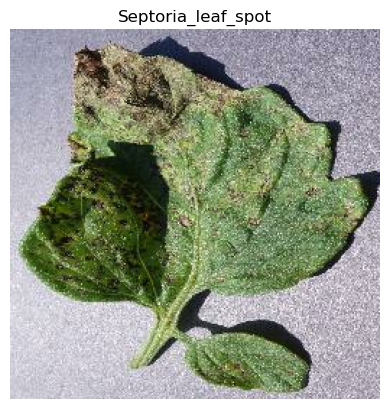

In [11]:
# visualize first image in batch
for image_batch, label_batch in images_dataset.take(1):
        plt.imshow(image_batch[0].numpy().astype("int"))
        plt.title(class_names[label_batch[0]])
        plt.axis('off')


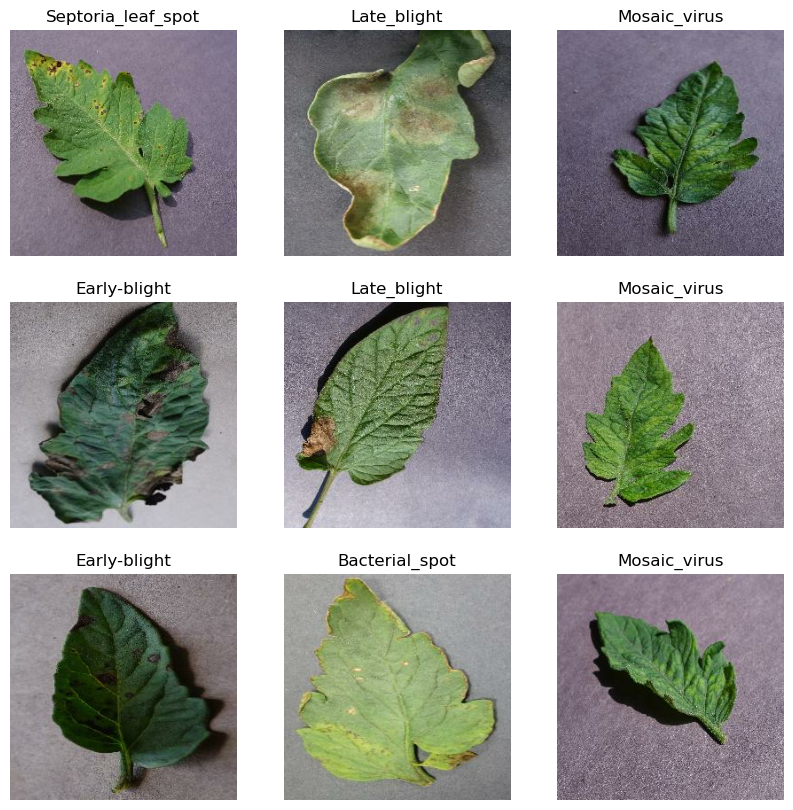

In [12]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in images_dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [13]:
len("images_TOMATO DATA")

18

In [14]:
from keras.preprocessing.image import ImageDataGenerator


train = ImageDataGenerator(rescale= 1/255)
validation = ImageDataGenerator(rescale= 1/255)
test = ImageDataGenerator(rescale = 1/255)

In [15]:
train_dataset = train.flow_from_directory("C:\\Users\\ASUS\\OneDrive\\Documents\\Tomato\\Tomato Data set\\Healthy", target_size= (200,200), batch_size = 3,
                                           class_mode ="binary")
 
validation_dataset = validation.flow_from_directory("C:\\Users\\ASUS\\OneDrive\\Documents\\Tomato\\Tomato Data set\\Unhealthy", target_size= (200,200), batch_size = 3,
                                           class_mode ="binary")
   

Found 42 images belonging to 3 classes.
Found 83 images belonging to 5 classes.


In [16]:
train_dataset.class_indices
train_dataset.classes


array([0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2])

In [17]:
import tensorflow as tf
def get_dataset_partitions_tf(ds,train_split=0.7, val_split=0.1, test_split=0.2, shuffle=True, shuffle_size=1000):
    ds_size=len(ds)
    if shuffle:
        ds=ds.shuffle(shuffle_size, seed=10)
        
        train_size= int(train_split* ds_size)
        val_size= int(val_split* ds_size)
        
        train_ds=ds.take(train_size)
        
        val_ds= ds.skip(train_size).take(val_size)
        
        test_ds= ds.skip(train_size + val_size)
        
        return train_ds, val_ds, test_ds
    

In [18]:
images_dataset

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [19]:
pip install tensorflow

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [20]:
#CNN
import tensorflow as tf
from tensorflow.keras import layers 
model_1 = tf.keras.models.Sequential([
                              layers.Conv2D(16,(3,3),activation ='relu', input_shape = (200,200,3)),
                              layers.MaxPool2D(2,2),
                                   
                                layers.Conv2D(32,(3,3),activation ='relu'),
                                layers.MaxPool2D(2,2),
                                                          
                                 layers.Conv2D(64,(3,3),activation ='relu'),
                                 layers.MaxPool2D(2,2),
                                    
                                 layers.Flatten(),
                                                        
                                 layers.Dense(512,activation = 'relu'),
                                                           
                                 layers.Dense(1,activation='sigmoid')
                                                          
                                  
                                                           ]
                                                          )

In [21]:
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 198, 198, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 99, 99, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 97, 97, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 48, 48, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 46, 46, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 23, 23, 64)        0

In [22]:
model_1.compile(loss = 'binary_crossentropy',
             optimizer =tf.keras.optimizers.Adadelta(),
             metrics = ['accuracy'] )

In [23]:
history = model_1.fit(train_dataset,
                     steps_per_epoch= 3,
                     epochs = 10,
                     validation_data= validation_dataset)

Epoch 1/10


3/3 [==============================] - 3s 709ms/step - loss: 0.6948 - accuracy: 0.2222 - val_loss: 0.6398 - val_accuracy: 0.2048
Epoch 2/10
3/3 [==============================] - 1s 610ms/step - loss: 0.6681 - accuracy: 0.6667 - val_loss: 0.5449 - val_accuracy: 0.1807
Epoch 3/10
3/3 [==============================] - 1s 622ms/step - loss: 0.6270 - accuracy: 0.6667 - val_loss: 0.4261 - val_accuracy: 0.1928
Epoch 4/10
3/3 [==============================] - 1s 653ms/step - loss: 0.6039 - accuracy: 0.7778 - val_loss: 0.3213 - val_accuracy: 0.1928
Epoch 5/10
3/3 [==============================] - 1s 629ms/step - loss: 0.6645 - accuracy: 0.6667 - val_loss: 0.2965 - val_accuracy: 0.1928
Epoch 6/10
3/3 [==============================] - 1s 657ms/step - loss: 0.5146 - accuracy: 0.5556 - val_loss: 0.1568 - val_accuracy: 0.1928
Epoch 7/10
3/3 [==============================] - 1s 673ms/step - loss: 0.6195 - accuracy: 0.7778 - val_loss: 0.1138 - val_accuracy: 0.1928
Epoch 8/10
3/3 [==

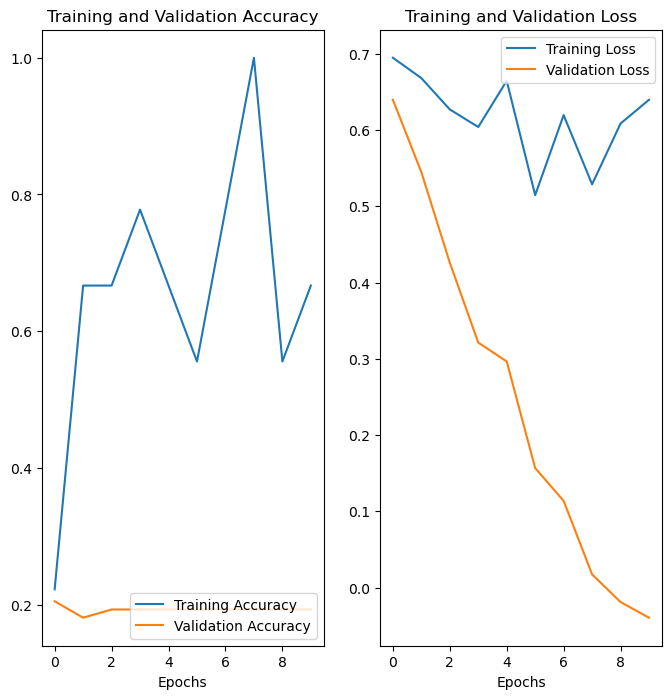

In [24]:
import matplotlib.pyplot as plt
epochs= 10
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.xlabel('Epochs')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.show()

In [25]:
al_loss, val_acc = model_1.evaluate(validation_dataset, verbose = 2)

28/28 - 1s - loss: -3.9439e-02 - accuracy: 0.1928 - 1s/epoch - 37ms/step


In [ ]:
import os
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

dir_path = "C:\\Users\\ASUS\\OneDrive\\Documents\\Tomato\\Tomato Data set\\Unhealthy\\Bacterial_spot\\Train"
for i in os.listdir(dir_path ):
    img = image.load_img(dir_path+'//'+i,target_size=(200,200))
    plt.imshow(img)
    plt.show()
    
    X = image.img_to_array(img)
    X = np.expand_dims(X, axis = 0)
    images = np.vstack([X])
        
    val =  model_1.predict(images)
    if val == 0:
        print("The plant is healthy")
    else:
        print("The plant is unhealthy[Bacterial_spot]")
        

In [ ]:
dir_path = "C:\\Users\\ASUS\\OneDrive\\Documents\\Tomato\\Tomato Data set\\Unhealthy\\Early_blight\\Train"
for i in os.listdir(dir_path ):
    img = image.load_img(dir_path+'//'+i,target_size=(200,200))
    plt.imshow(img)
    plt.show()
    
    X = image.img_to_array(img)
    X = np.expand_dims(X, axis = 0)
    images = np.vstack([X])
        
    val =  model_1.predict(images)
    if val == 0:
        print("The plant is healthy")
    else:
        print("The plant is unhealthy[Early_blight]")
        

In [ ]:
dir_path = "C:\\Users\\ASUS\\OneDrive\\Documents\\Tomato\\Tomato Data set\\Unhealthy\\Late_blight\\Train"
for i in os.listdir(dir_path ):
    img = image.load_img(dir_path+'//'+i,target_size=(200,200))
    plt.imshow(img)
    plt.show()
    
    X = image.img_to_array(img)
    X = np.expand_dims(X, axis = 0)
    images = np.vstack([X])
        
    val =  model_1.predict(images)
    if val == 0:
        print("The plant is healthy")
    else:
        print("The plant is unhealthy[Late_blight]")
        

In [ ]:
dir_path = "C:\\Users\\ASUS\\OneDrive\\Documents\\Tomato\\Tomato Data set\\Unhealthy\\Mosaic_virus\\Train"
for i in os.listdir(dir_path ):
    img = image.load_img(dir_path+'//'+i,target_size=(200,200))
    plt.imshow(img)
    plt.show()
    
    X = image.img_to_array(img)
    X = np.expand_dims(X, axis = 0)
    images = np.vstack([X])
        
    val =  model_1.predict(images)
    if val == 0:
        print("The plant is healthy")
    else:
        print("The plant is unhealthy[Mosaic_virus]")
        

In [ ]:
dir_path = "C:\\Users\\ASUS\\OneDrive\\Documents\\Tomato\\Tomato Data set\\Unhealthy\\Septoria_leaf_spot\\Train"
for i in os.listdir(dir_path ):
    img = image.load_img(dir_path+'//'+i,target_size=(200,200))
    plt.imshow(img)
    plt.show()
    
    X = image.img_to_array(img)
    X = np.expand_dims(X, axis = 0)
    images = np.vstack([X])
        
    val =  model_1.predict(images)
    if val == 0:
        print("The plant is healthy")
    else:
        print("The plant is unhealthy[Septoria_leaf_spot]")
        

In [33]:
#resnet

import datetime

In [34]:
# Creating a callback function to save model's metrics
def create_tensorboard_callback(dir_name, experiment_name):
    log_dir= dir_name + "/" + experiment_name + "/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = tf.keras.callbacks.TensorBoard(
      log_dir=log_dir
     )
    print(f"Saving TensorBoard log files to: {log_dir}")
    return tensorboard_callback

In [35]:
tl_model = tf.keras.applications.ResNet50V2(include_top=False)
tl_model.trainable = False
inputs = layers.Input(shape=(200, 200, 3), name='input_layer')
x = tl_model(inputs)
x = layers.GlobalAveragePooling2D()(x)
outputs = layers.Dense(1, activation='sigmoid')(x)
model_2= tf.keras.Model(inputs, outputs)

In [36]:
model_2.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 200, 200, 3)]     0         
                                                                 
 resnet50v2 (Functional)     (None, None, None, 2048   23564800  
                             )                                   
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_2 (Dense)             (None, 1)                 2049      
                                                                 
Total params: 23566849 (89.90 MB)
Trainable params: 2049 (8.00 KB)
Non-trainable params: 23564800 (89.89 MB)
_________________________________________________________________


In [37]:
model_2.compile(optimizer='adam',
loss = 'binary_crossentropy',
              metrics=['accuracy'])


In [38]:
epochs=10
history_2 = model_2.fit(
  train_dataset,
  validation_data=validation_dataset,
  epochs=epochs
)

Epoch 1/10
14/14 [==============================] - 13s 814ms/step - loss: 0.4526 - accuracy: 0.7143 - val_loss: -3.5854 - val_accuracy: 0.1928
Epoch 2/10
14/14 [==============================] - 9s 680ms/step - loss: 0.3605 - accuracy: 0.7143 - val_loss: -3.0341 - val_accuracy: 0.1928
Epoch 3/10
14/14 [==============================] - 9s 654ms/step - loss: 0.2756 - accuracy: 0.7143 - val_loss: -3.1193 - val_accuracy: 0.1928
Epoch 4/10
14/14 [==============================] - 9s 665ms/step - loss: 0.2476 - accuracy: 0.7143 - val_loss: -2.9514 - val_accuracy: 0.1928
Epoch 5/10
14/14 [==============================] - 11s 818ms/step - loss: 0.1949 - accuracy: 0.7143 - val_loss: -2.8455 - val_accuracy: 0.1928
Epoch 6/10
14/14 [==============================] - 7s 559ms/step - loss: 0.1492 - accuracy: 0.7143 - val_loss: -2.7097 - val_accuracy: 0.1928
Epoch 7/10
14/14 [==============================] - 9s 662ms/step - loss: 0.1180 - accuracy: 0.7143 - val_loss: -2.6722 - val_accuracy: 0.19

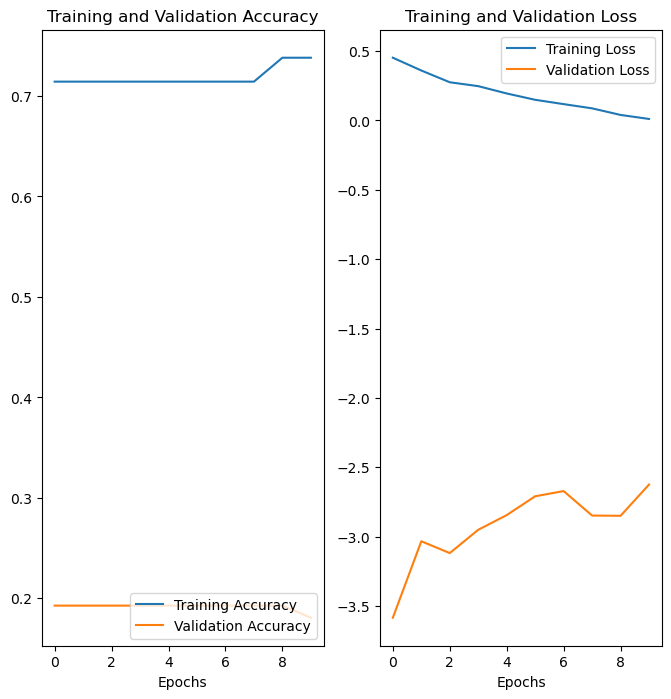

In [39]:
acc = history_2.history['accuracy']
val_acc = history_2.history['val_accuracy']

loss = history_2.history['loss']
val_loss = history_2.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.xlabel('Epochs')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')

plt.show()

In [40]:
val_loss, val_acc = model_2.evaluate(validation_dataset, verbose = 2)

28/28 - 7s - loss: -2.6251e+00 - accuracy: 0.1807 - 7s/epoch - 261ms/step


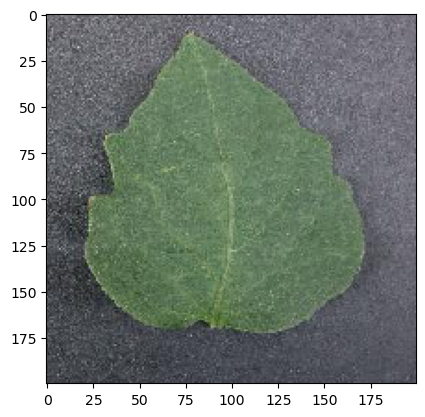

1/1 [==============================] - 1s 1s/step
The plant is healthy


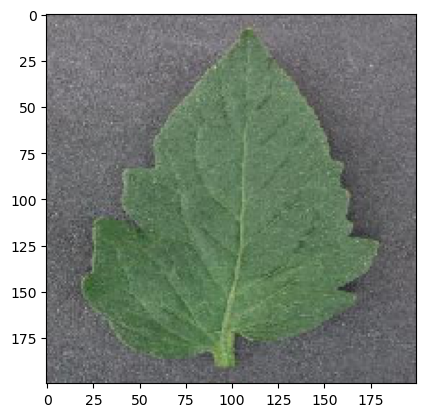

1/1 [==============================] - 0s 194ms/step
The plant is healthy


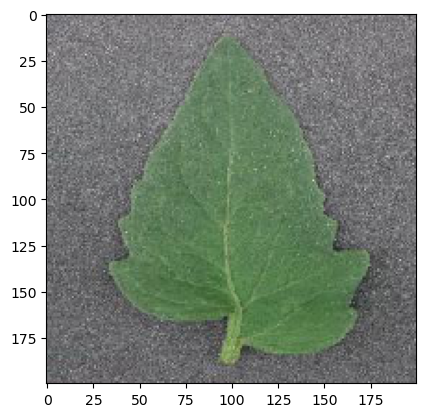

1/1 [==============================] - 0s 190ms/step
The plant is healthy


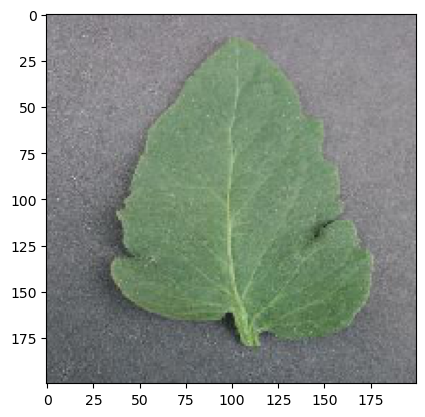

1/1 [==============================] - 0s 188ms/step
The plant is healthy


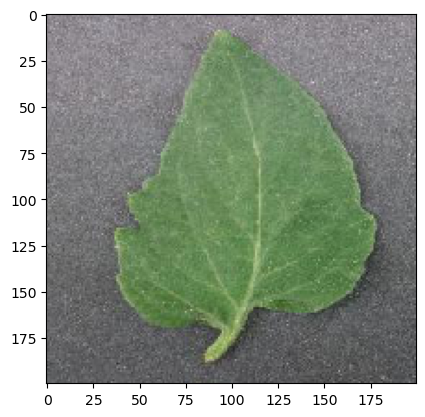

1/1 [==============================] - 0s 176ms/step
The plant is healthy


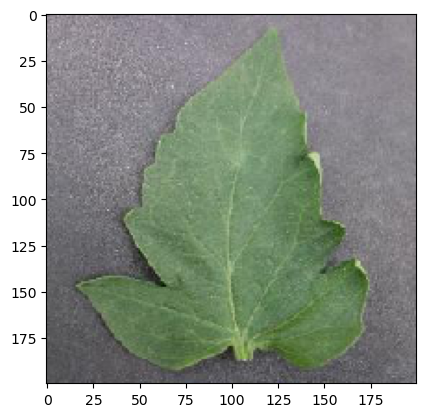

1/1 [==============================] - 0s 157ms/step
The plant is healthy


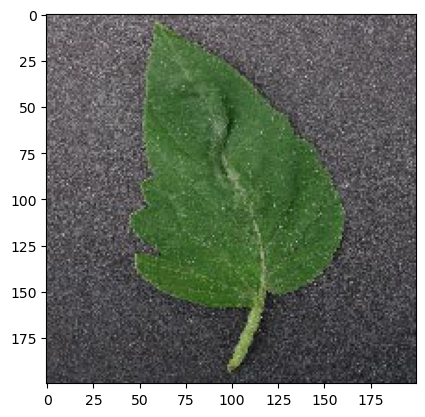

1/1 [==============================] - 0s 145ms/step
The plant is healthy


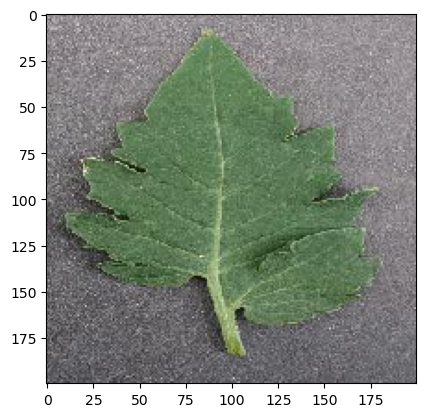

1/1 [==============================] - 0s 173ms/step
The plant is healthy


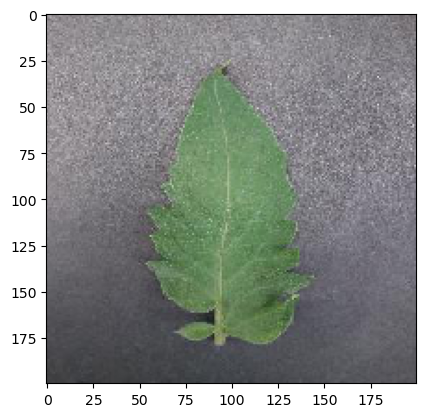

1/1 [==============================] - 0s 192ms/step
The plant is healthy


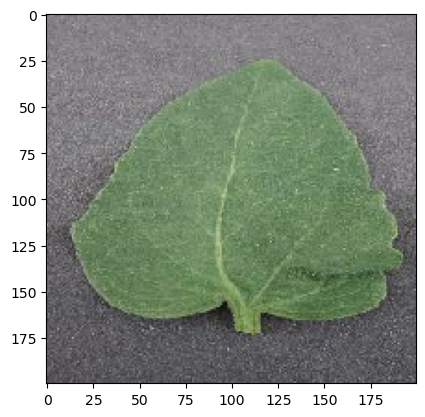

1/1 [==============================] - 0s 168ms/step
The plant is healthy


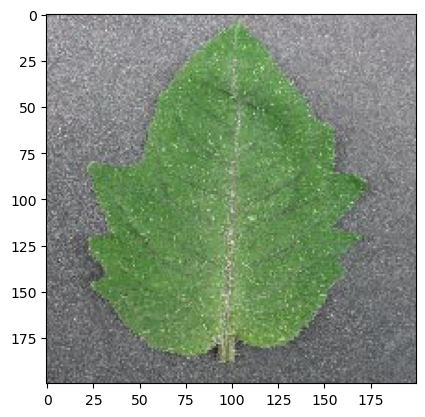

1/1 [==============================] - 0s 169ms/step
The plant is healthy


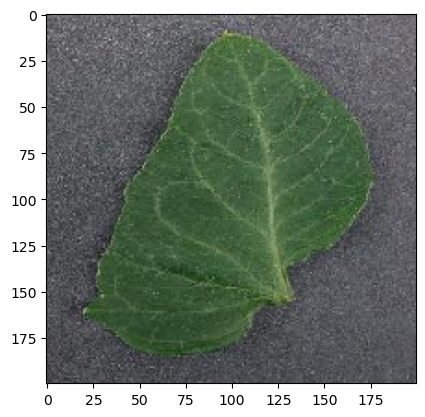

1/1 [==============================] - 0s 139ms/step
The plant is healthy


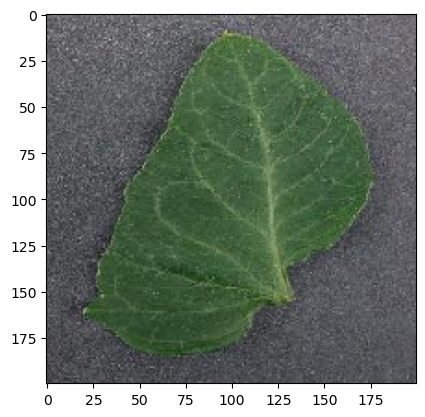

1/1 [==============================] - 0s 188ms/step
The plant is healthy


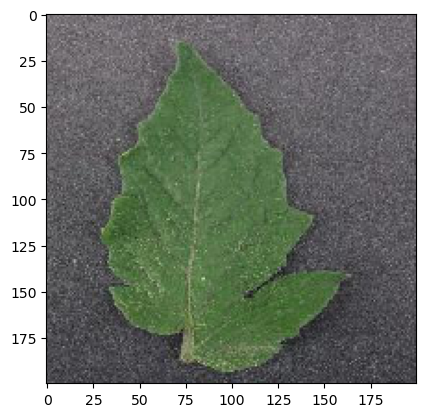

1/1 [==============================] - 0s 187ms/step
The plant is healthy


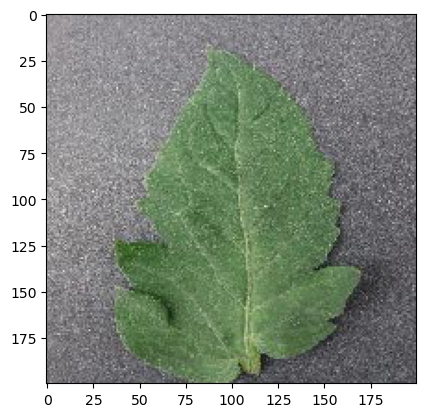

1/1 [==============================] - 0s 183ms/step
The plant is healthy


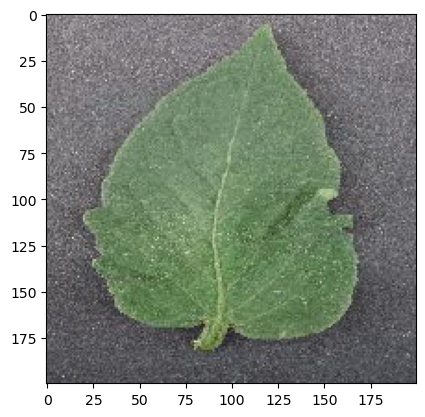

1/1 [==============================] - 0s 135ms/step
The plant is healthy


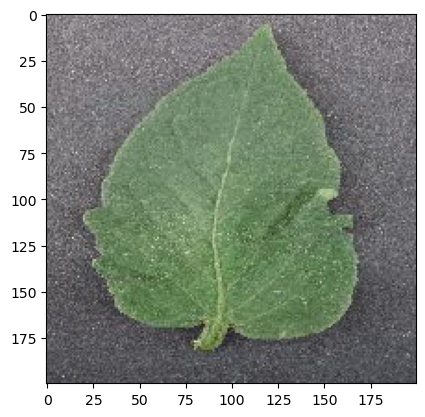

1/1 [==============================] - 0s 176ms/step
The plant is healthy


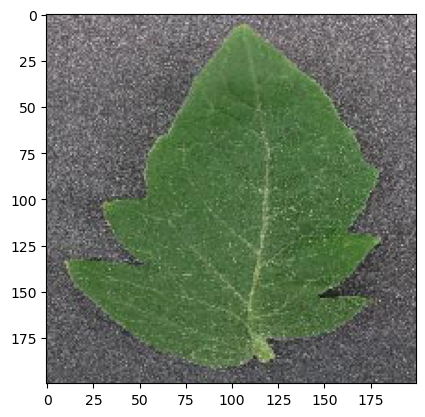

1/1 [==============================] - 0s 181ms/step
The plant is healthy


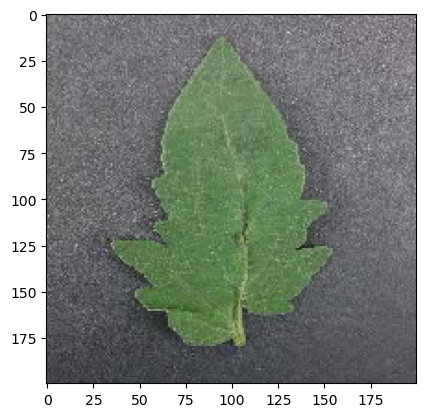

1/1 [==============================] - 0s 181ms/step
The plant is healthy


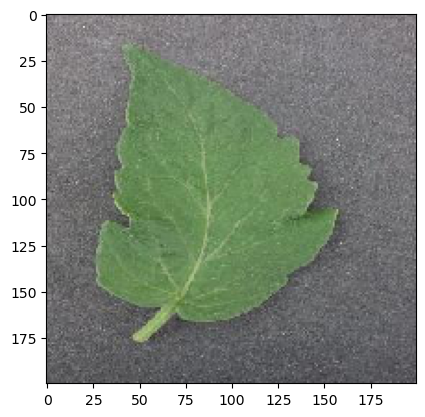

1/1 [==============================] - 0s 189ms/step
The plant is healthy


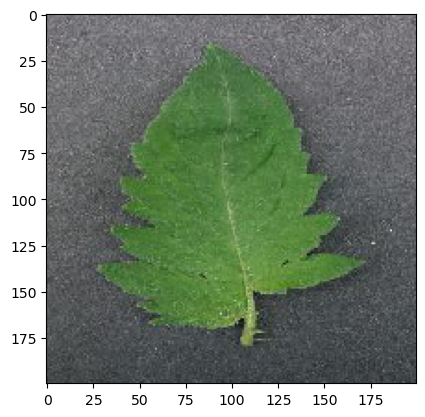

1/1 [==============================] - 0s 173ms/step
The plant is healthy


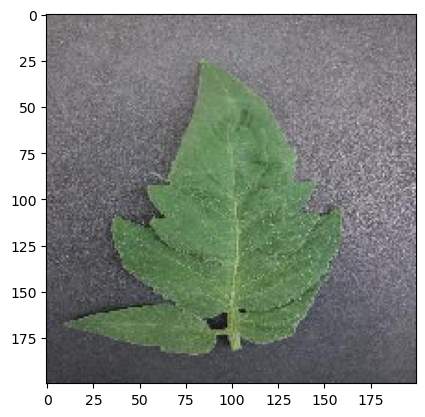

1/1 [==============================] - 0s 171ms/step
The plant is healthy


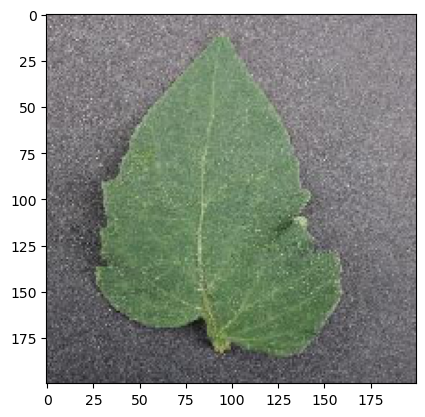

1/1 [==============================] - 0s 148ms/step
The plant is healthy


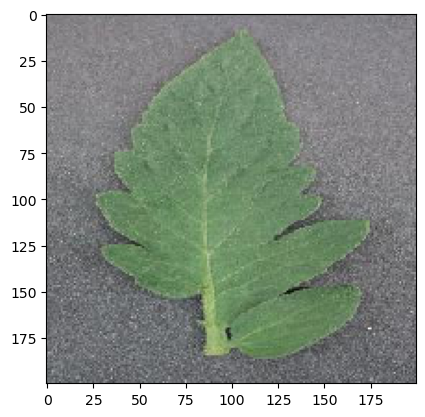

1/1 [==============================] - 0s 188ms/step
The plant is healthy


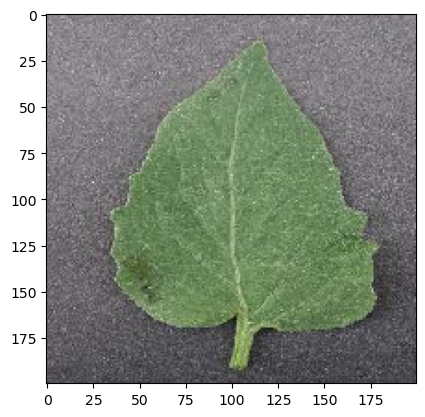

1/1 [==============================] - 0s 173ms/step
The plant is healthy


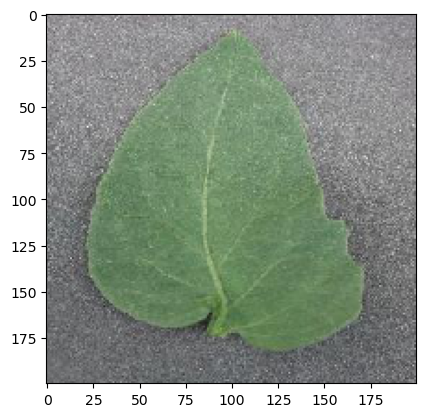

1/1 [==============================] - 0s 187ms/step
The plant is healthy


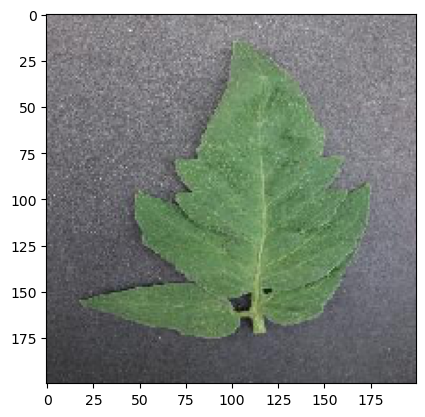

1/1 [==============================] - 0s 175ms/step
The plant is healthy


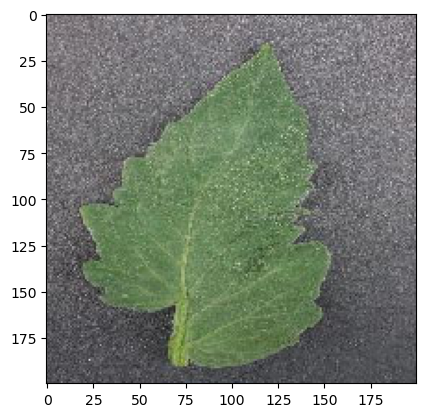

1/1 [==============================] - 0s 190ms/step
The plant is healthy


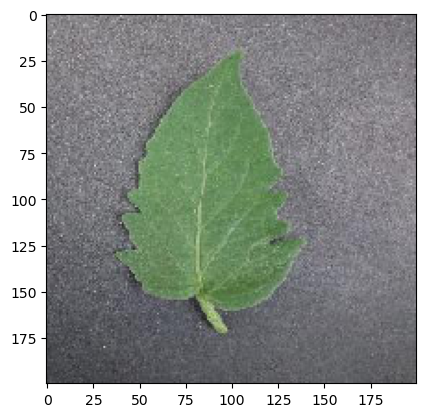

1/1 [==============================] - 0s 188ms/step
The plant is healthy


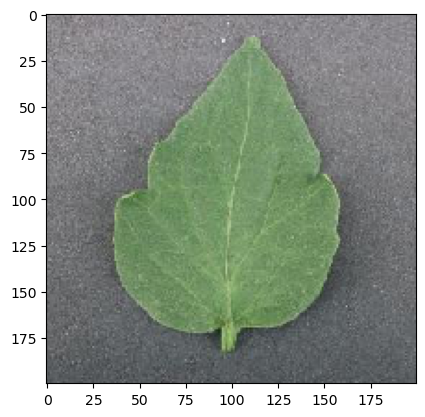

1/1 [==============================] - 0s 195ms/step
The plant is healthy


In [41]:
dir_path = 'C:\\Users\\ASUS\\OneDrive\\Documents\\Tomato\\Tomato Data set\\Healthy\\Train'
for i in os.listdir(dir_path ):
    img = image.load_img(dir_path+'//'+i,target_size=(200,200))
    plt.imshow(img)
    plt.show()
    
    X = image.img_to_array(img)
    X = np.expand_dims(X, axis = 0)
    images = np.vstack([X])
        
    val =  model_2.predict(images)
    if val == 0:
        print("The plant is unhealthy")
    else:
        print("The plant is healthy")

In [42]:
## Loading VGG16 model
from keras.applications import VGG16
base_model = VGG16(weights="imagenet", include_top=False, input_shape=(200,200,3))
base_model.trainable = False ## Not trainable weights

In [43]:
flatten_layer = layers.Flatten()
dense_layer_1 = layers.Dense(50, activation='relu')
dense_layer_2 = layers.Dense(20, activation='relu')
prediction_layer = layers.Dense(1, activation='sigmoid')


model_3 = models.Sequential([
    
    base_model,
    flatten_layer,
    dense_layer_1,
    dense_layer_2,
    prediction_layer
])

In [44]:
model_3.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [45]:
history_3 = model_3.fit(
  train_dataset,
  validation_data= validation_dataset,
  epochs=epochs
)

Epoch 1/10
14/14 [==============================] - 21s 1s/step - loss: 0.5631 - accuracy: 0.7143 - val_loss: -5.8930 - val_accuracy: 0.1928
Epoch 2/10
14/14 [==============================] - 19s 1s/step - loss: 0.4002 - accuracy: 0.5238 - val_loss: -1.8490 - val_accuracy: 0.2048
Epoch 3/10
14/14 [==============================] - 19s 1s/step - loss: 0.4092 - accuracy: 0.7143 - val_loss: -10.1898 - val_accuracy: 0.1928
Epoch 4/10
14/14 [==============================] - 19s 1s/step - loss: -0.4123 - accuracy: 0.7143 - val_loss: -8.6408 - val_accuracy: 0.1928
Epoch 5/10
14/14 [==============================] - 19s 1s/step - loss: -1.2978 - accuracy: 0.8095 - val_loss: -8.8462 - val_accuracy: 0.2048
Epoch 6/10
14/14 [==============================] - 19s 1s/step - loss: -1.5720 - accuracy: 0.7381 - val_loss: -2.4851 - val_accuracy: 0.1687
Epoch 7/10
14/14 [==============================] - 20s 1s/step - loss: -2.0589 - accuracy: 0.7857 - val_loss: -14.8381 - val_accuracy: 0.1928
Epoch 8

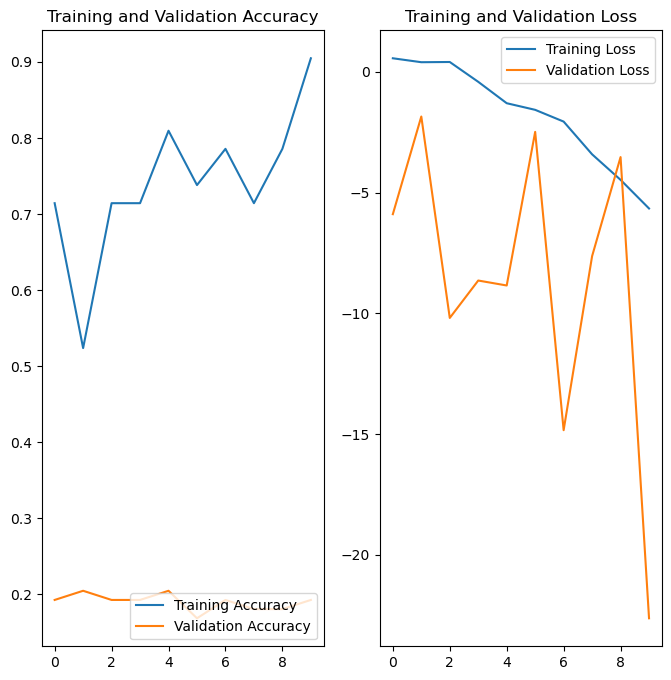

In [46]:
acc = history_3.history['accuracy']
val_acc = history_3.history['val_accuracy']

loss = history_3.history['loss']
val_loss = history_3.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [47]:
val_loss, val_acc = model_3.evaluate(validation_dataset, verbose = 2)

28/28 - 13s - loss: -2.2627e+01 - accuracy: 0.1928 - 13s/epoch - 452ms/step


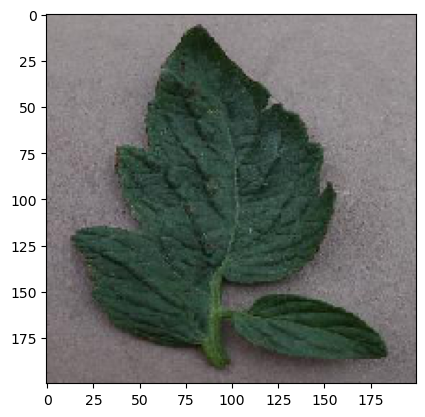

1/1 [==============================] - 0s 205ms/step
The plant is unhealthy


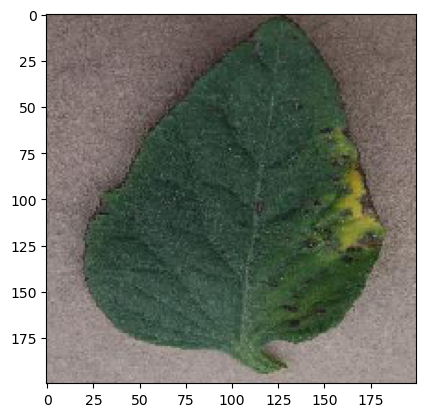

1/1 [==============================] - 0s 236ms/step
The plant is unhealthy


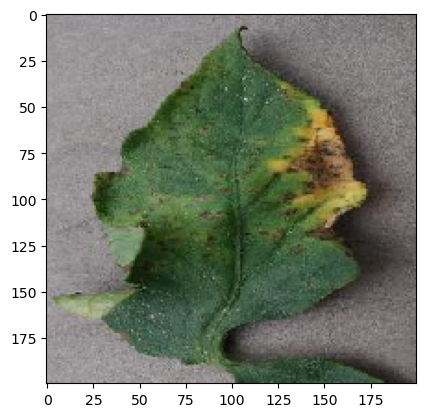

1/1 [==============================] - 0s 216ms/step
The plant is unhealthy


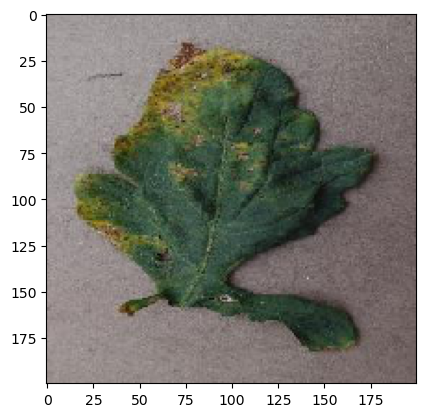

1/1 [==============================] - 0s 187ms/step
The plant is unhealthy


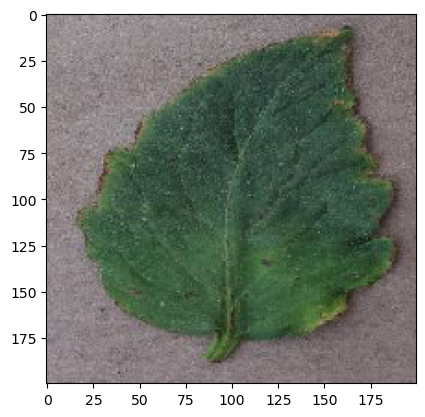

1/1 [==============================] - 0s 220ms/step
The plant is unhealthy


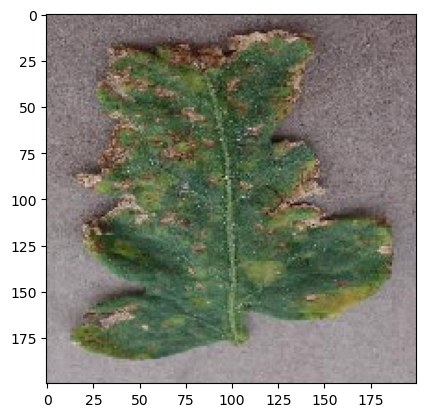

1/1 [==============================] - 0s 220ms/step
The plant is unhealthy


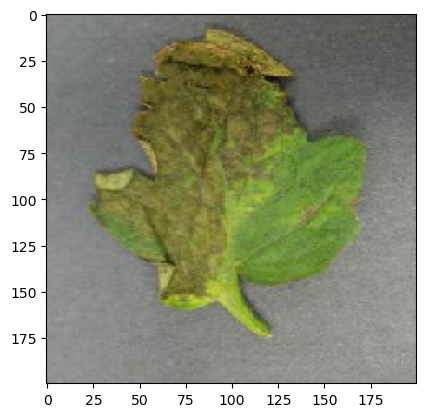

1/1 [==============================] - 0s 235ms/step
The plant is unhealthy


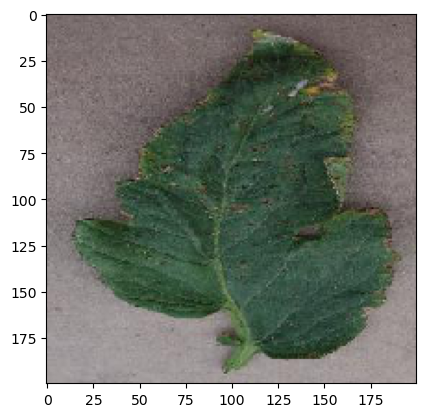

1/1 [==============================] - 0s 213ms/step
The plant is unhealthy


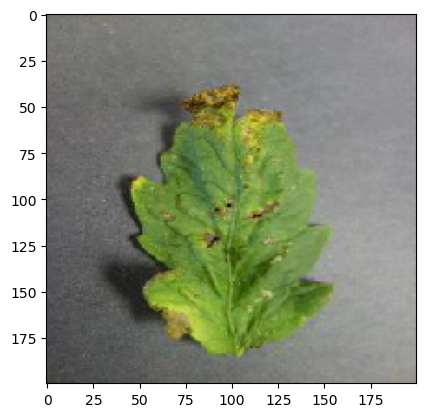

1/1 [==============================] - 0s 220ms/step
The plant is unhealthy


In [51]:
dir_path = "C:\\Users\\ASUS\\OneDrive\\Documents\\Tomato\\Tomato Data set\\Unhealthy\\Bacterial_spot\\train"
for i in os.listdir(dir_path ):
    img = image.load_img(dir_path+'//'+i,target_size=(200,200))
    plt.imshow(img)
    plt.show()
    
    X = image.img_to_array(img)
    X = np.expand_dims(X, axis = 0)
    images = np.vstack([X])
        
    val =  model_3.predict(images)
    if val == 0:
        print("The plant is healthy")
    else:
        print("The plant is unhealthy")

In [52]:
#Alexnet
import tensorflow as tf
from tensorflow import keras
model_4 =model = keras.models.Sequential([
    keras.layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu', input_shape=(200,200,3)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Flatten(),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(1, activation='sigmoid')
])


In [53]:
model_4.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 48, 48, 96)        34944     
                                                                 
 batch_normalization (Batch  (None, 48, 48, 96)        384       
 Normalization)                                                  
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 23, 23, 96)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 23, 23, 256)       614656    
                                                                 
 batch_normalization_1 (Bat  (None, 23, 23, 256)       1024      
 chNormalization)                                                
                                                      

In [54]:
model_4.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy'])


history_4 = model_4.fit(
  train_dataset,
  validation_data= validation_dataset,
  epochs=epochs
)

Epoch 1/10
14/14 [==============================] - 9s 530ms/step - loss: 0.2991 - accuracy: 0.6905 - val_loss: 3.2530 - val_accuracy: 0.1928
Epoch 2/10
14/14 [==============================] - 6s 443ms/step - loss: 0.2857 - accuracy: 0.7143 - val_loss: 3.2530 - val_accuracy: 0.1928
Epoch 3/10
14/14 [==============================] - 6s 443ms/step - loss: 0.2857 - accuracy: 0.7143 - val_loss: 3.2530 - val_accuracy: 0.1928
Epoch 4/10
14/14 [==============================] - 6s 456ms/step - loss: 0.2857 - accuracy: 0.7143 - val_loss: 3.2530 - val_accuracy: 0.1928
Epoch 5/10
14/14 [==============================] - 6s 450ms/step - loss: 0.2857 - accuracy: 0.7143 - val_loss: 3.2530 - val_accuracy: 0.1928
Epoch 6/10
14/14 [==============================] - 6s 460ms/step - loss: 0.2857 - accuracy: 0.7143 - val_loss: 3.2530 - val_accuracy: 0.1928
Epoch 7/10
14/14 [==============================] - 7s 511ms/step - loss: 0.2857 - accuracy: 0.7143 - val_loss: 3.2530 - val_accuracy: 0.1928
Epoch 

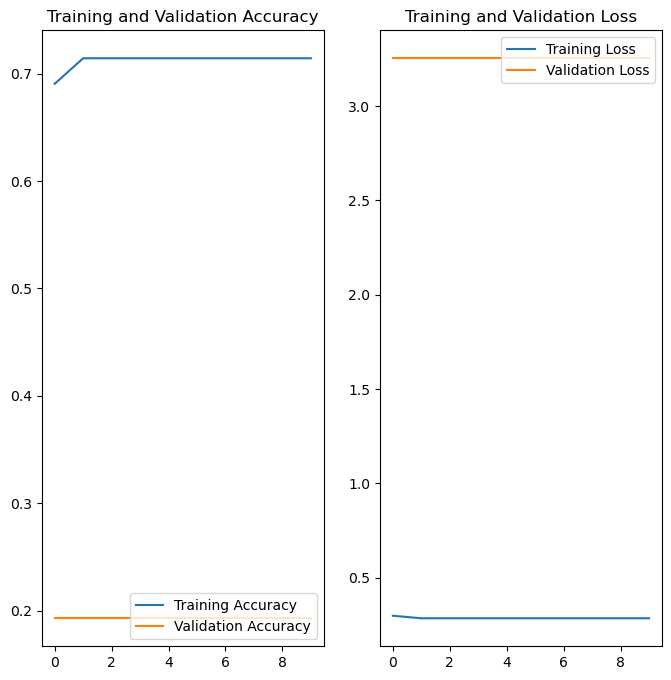

In [55]:
acc = history_4.history['accuracy']
val_acc = history_4.history['val_accuracy']

loss = history_4.history['loss']
val_loss = history_4.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [56]:
val_loss, val_acc = model_4.evaluate(validation_dataset, verbose = 2)

28/28 - 2s - loss: 3.2530 - accuracy: 0.1928 - 2s/epoch - 66ms/step


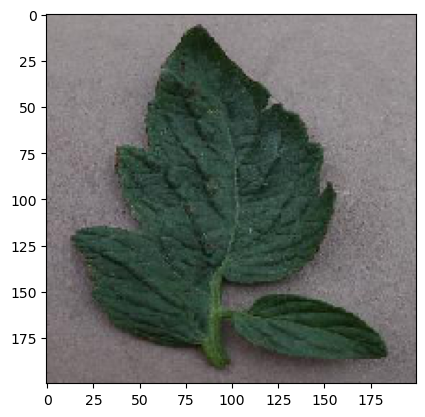

1/1 [==============================] - 0s 48ms/step
The plant is unhealthy


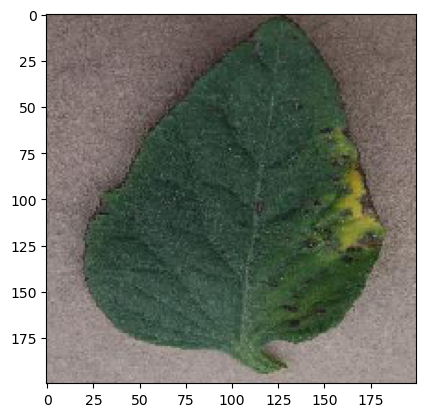

1/1 [==============================] - 0s 63ms/step
The plant is unhealthy


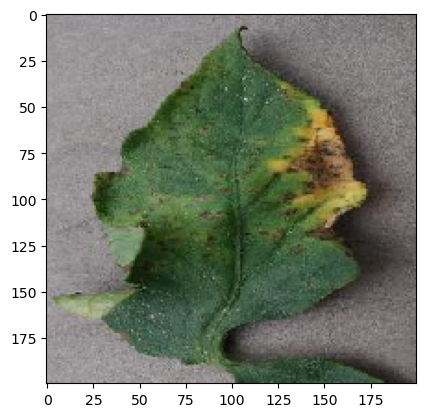

1/1 [==============================] - 0s 63ms/step
The plant is unhealthy


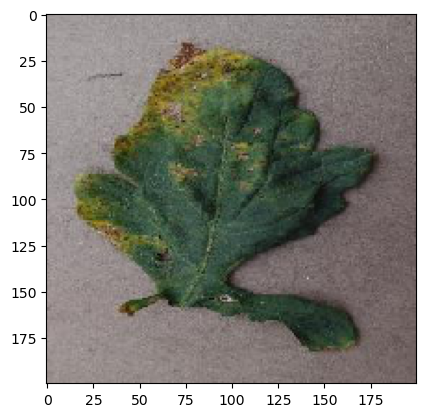

1/1 [==============================] - 0s 61ms/step
The plant is unhealthy


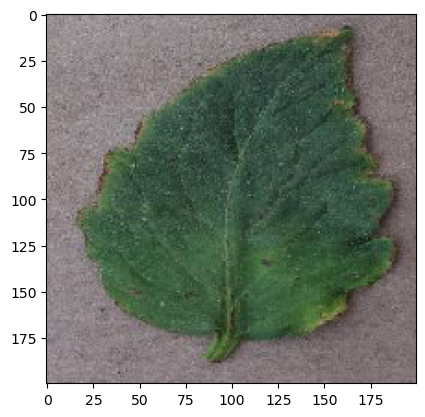

1/1 [==============================] - 0s 58ms/step
The plant is unhealthy


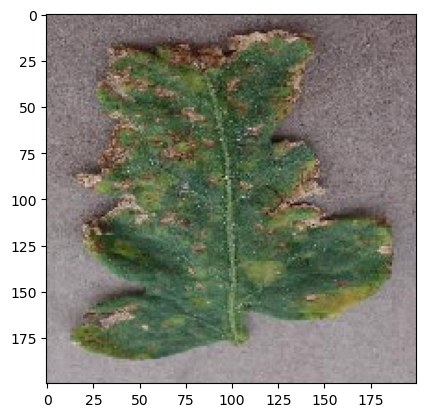

1/1 [==============================] - 0s 62ms/step
The plant is unhealthy


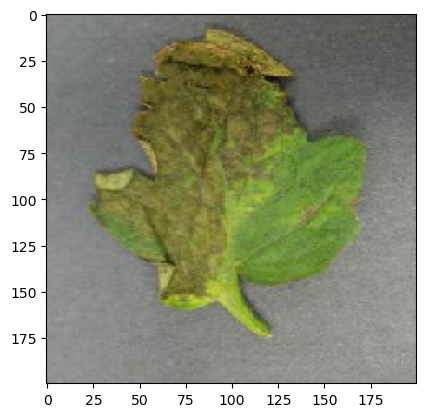

1/1 [==============================] - 0s 62ms/step
The plant is unhealthy


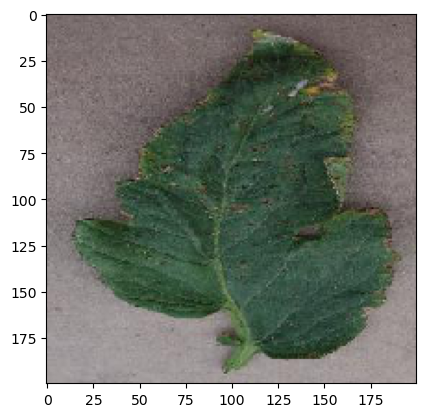

1/1 [==============================] - 0s 52ms/step
The plant is unhealthy


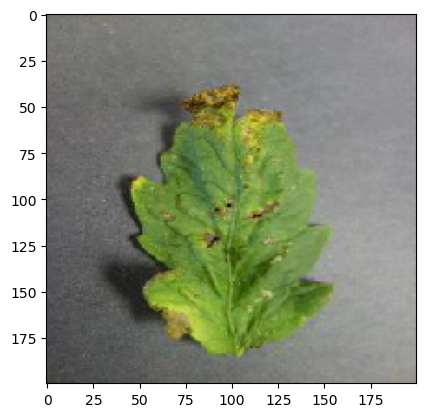

1/1 [==============================] - 0s 50ms/step
The plant is unhealthy


In [59]:
dir_path = 'C:\\Users\\ASUS\\OneDrive\\Documents\\Tomato\\Tomato Data set\\Unhealthy\\Bacterial_spot\\train'
for i in os.listdir(dir_path ):
    img = image.load_img(dir_path+'//'+i,target_size=(200,200))
    plt.imshow(img)
    plt.show()
    
    X = image.img_to_array(img)
    X = np.expand_dims(X, axis = 0)
    images = np.vstack([X])
        
    val =  model_4.predict(images)
    if val == 0:
        print("The plant is healthy")
    else:
        print("The plant is unhealthy")